In [1]:
import tensorflow as tf
import os
import random
import imghdr
import cv2
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, Input

C:\Users\HP\AppData\Local\Temp\ipykernel_6800\713883836.py:4: DeprecationWarning: 'imghdr' is deprecated and slated for removal in Python 3.13
  import imghdr


In [2]:
# Avoid OOM errors by setting GPU Memory Consumption Growth
cpus = tf.config.experimental.list_physical_devices('CPU')
for cpu in cpus:
    tf.config.experimental.set_virtual_device_configuration(cpu, [tf.config.experimental.VirtualDeviceConfiguration()])
tf.config.list_physical_devices('CPU')

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

In [3]:
def grayscale(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img

def equalize(img):
    img = cv2.equalizeHist(img)
    return img

def preprocessing(img):
    img = grayscale(img)     # CONVERT TO GRAYSCALE
    img = equalize(img)      # STANDARDIZE THE LIGHTING IN AN IMAGE
    img = img / 255.0        # TO NORMALIZE VALUES BETWEEN 0 AND 1 INSTEAD OF 0 TO 255
    return img

In [4]:
data_dir = 'data'   # Set your actual data directory
image_exts = ['jpeg','jpg', 'bmp', 'png']  # Define allowed image formats

images = []
classNo = []

# Load labels from Excel
labels_df = pd.read_excel("labels.xlsx")  # Replace with actual file name
label_mapping = dict(zip(labels_df["ClassId"], labels_df["Name"]))  # Adjust column names

# Get list of class folders
class_folders = os.listdir(data_dir)
print("Total Classes Detected:", len(class_folders))
print("Importing Classes.....")

# Define a fixed image size (e.g., 255x255)
IMG_SIZE = (128, 128)

for class_id, image_class in enumerate(class_folders):
    class_path = os.path.join(data_dir, image_class)
    
    if not os.path.isdir(class_path):
        continue  # Skip non-directory files
    
    for image in os.listdir(class_path):
        image_path = os.path.join(class_path, image)
        
        try:
            tip = imghdr.what(image_path)
            if tip not in image_exts:
                print(f'Invalid image format: {image_path}')
                os.remove(image_path)
                continue
            
            img = cv2.imread(image_path)
            if img is None:
                print(f'Corrupted image: {image_path}')
                os.remove(image_path)
                continue
            
            img = cv2.resize(img, IMG_SIZE)
            img = preprocessing(img)  # Apply preprocessing
            
            images.append(img)
            classNo.append(class_id)
        
        except Exception as e:
            print(f'Issue with image {image_path}: {e}')
    
    print(class_id, end=" ")

print("\nProcessing Complete.")


# Convert lists to NumPy arrays
images = np.array(images, dtype=np.float32).reshape(-1, IMG_SIZE[0], IMG_SIZE[1], 1)  # Add depth of 1
classNo = np.array(classNo, dtype=np.int32)


Total Classes Detected: 43
Importing Classes.....
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 
Processing Complete.


In [5]:
# Load dataset before applying transformations
data = tf.keras.utils.image_dataset_from_directory(data_dir)

# Store class names before applying .map()
class_names = data.class_names  # Get numeric folder names ['0', '1', '2', ..., '42']

# Apply grayscale and normalization
data = data.map(lambda x, y: (tf.image.rgb_to_grayscale(x) / 255.0, y))

# Map numeric folder names to actual class names
mapped_class_names = [label_mapping[int(i)] for i in class_names]  
print(mapped_class_names)

Found 12472 files belonging to 43 classes.
['Speed limit (5km/h)', 'No entry', 'prohibition to double for trucks', 'Dont Go Left', 'priority intersection ahead', 'Go Right', 'stop', 'move down left', 'No Car', 'move down right', 'Speed limit (80km/h)', 'Bycycles', 'Speed limit (30km/h)', 'Go Left or straight', 'Go straight', 'General warning', 'prohibition to double for trucks', 'No trucks allowed', 'left bend ahead', 'right bend ahead', 'Roundabout mandatory', 'watch out for cars', 'Slippery road', 'Speed limit (40km/h)', 'Narrow road ahead', 'Go Left ', 'double bend ahead', 'Traffic signals', 'road work ahead', 'Zebra Crossing', 'No overtaking', 'Children crossing', 'yield (or give way)', 'Go right or straight', 'Speed limit (50km/h)', 'Speed limit (20km/h)', 'Speed limit (100km/h)', 'Closed to all vehicles', 'Speed limit (60km/h)', 'Speed limit (70km/h)', 'speed limit (80km/h)', 'no overtaking', 'uneven road']


In [6]:
#Data Augmentation
dataGen = ImageDataGenerator(
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    shear_range=0.1,
    rotation_range=10,
    validation_split=0.2  # Reserve 20% for validation
)

dataGen.fit(images)
batches = dataGen.flow(images, classNo, batch_size=32)
X_batch, y_batch = next(batches)

In [7]:
train_augmented = dataGen.flow_from_directory(
    data_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode="sparse",
    color_mode="grayscale",  
    subset="training"  # 80% Training Data
)

val_generator = dataGen.flow_from_directory(
    data_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode="sparse",
    color_mode="grayscale",
    subset="validation"  # 20% Validation Data
)
print(f"Training samples: {train_augmented.samples}")
print(f"Validation samples: {val_generator.samples}")


Found 9985 images belonging to 43 classes.
Found 2487 images belonging to 43 classes.
Training samples: 9985
Validation samples: 2487


In [8]:

# Load full validation set
val_images_all, val_labels_all = [], []

val_batches = len(val_generator)

for _ in range(val_batches):
    imgs, labels = next(val_generator)
    val_images_all.append(imgs)
    val_labels_all.append(labels)

# Convert lists to NumPy arrays
val_images_all = np.concatenate(val_images_all, axis=0)
val_labels_all = np.concatenate(val_labels_all, axis=0)

# Ensure all 43 classes are represented
num_classes = 43
test_images, test_labels = [], []
val_images, val_labels = [], []

for class_id in range(num_classes):
    # Get all samples of this class
    class_indices = np.where(val_labels_all == class_id)[0]
    
    # Shuffle indices to ensure randomness
    np.random.shuffle(class_indices)
    
    # Define split (33% for test, 67% for validation)
    split_idx = int(0.33 * len(class_indices))
    
    test_images.extend(val_images_all[class_indices[:split_idx]])
    test_labels.extend(val_labels_all[class_indices[:split_idx]])
    
    val_images.extend(val_images_all[class_indices[split_idx:]])
    val_labels.extend(val_labels_all[class_indices[split_idx:]])

# Convert lists to NumPy arrays
test_images = np.array(test_images)
test_labels = np.array(test_labels)
val_images = np.array(val_images)
val_labels = np.array(val_labels)

# Print dataset sizes
print(f"Final Test set size: {len(test_images)} (Ensuring all classes are present)")
print(f"Final Validation set size: {len(val_images)}")

# Shuffle datasets
shuffle_test = np.random.permutation(len(test_images))
shuffle_val = np.random.permutation(len(val_images))

test_images, test_labels = test_images[shuffle_test], test_labels[shuffle_test]
val_images, val_labels = val_images[shuffle_val], val_labels[shuffle_val]

# Create new generators
val_generator = ImageDataGenerator().flow(val_images, val_labels, batch_size=32)
test_generator = ImageDataGenerator().flow(test_images, test_labels, batch_size=32)

# Verify class distribution
unique_test_classes = np.unique(test_labels)
unique_val_classes = np.unique(val_labels)

print(f"Unique classes in Test set: {len(unique_test_classes)} (Expected: 43)")
print(f"Unique classes in Validation set: {len(unique_val_classes)} (Expected: 43)")


Final Test set size: 795 (Ensuring all classes are present)
Final Validation set size: 1692
Unique classes in Test set: 43 (Expected: 43)
Unique classes in Validation set: 43 (Expected: 43)


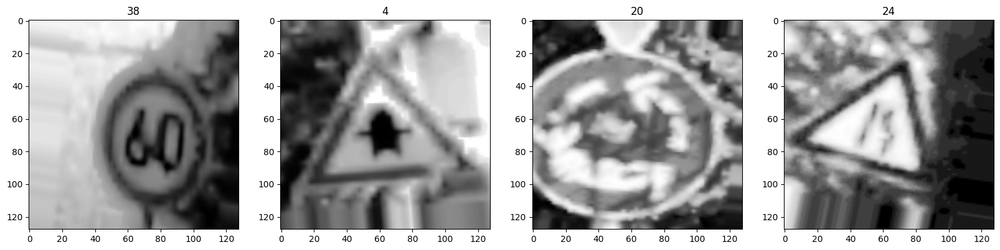

In [9]:
X_batch_rescaled = (X_batch * 255).astype(np.uint8) if X_batch.max() <= 1 else X_batch

fig, ax = plt.subplots(ncols=4, figsize=(20, 20))

for idx, img in enumerate(X_batch_rescaled[:4]):
    img = np.squeeze(img)  # Remove extra dimensions if any
    if img.shape[-1] == 1:  # If grayscale, remove last dimension
        img = img[:, :, 0]
    
    ax[idx].imshow(img, cmap="gray" if len(img.shape) == 2 else None)  # Use grayscale if needed
    ax[idx].title.set_text(str(y_batch[idx]))  # Ensure title is string
    ax[idx].axis("on")  # Hide axes

plt.show()


In [10]:
dataGen.fit(images)
batches = dataGen.flow(images, classNo, batch_size=32)
X_batch, y_batch = next(batches)

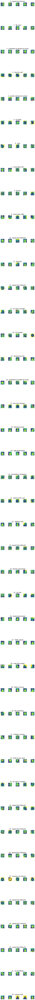

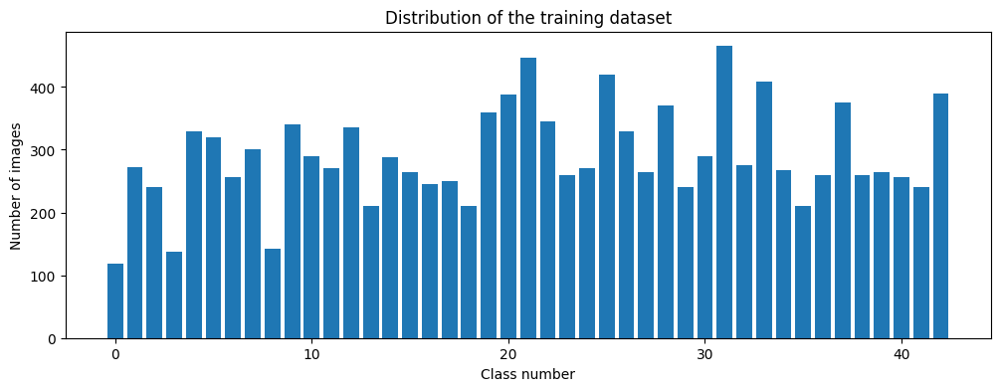

In [11]:
# Display some sample images for each class
num_of_samples = []
cols = 5
num_classes = len(class_names)
fig, axs = plt.subplots(nrows=num_classes, ncols=cols, figsize=(5, num_classes * 3))
fig.tight_layout()

for j, class_name in enumerate(class_names):
    class_images = [img for idx, img in enumerate(images) if classNo[idx] == j]
    num_of_samples.append(len(class_images))
    
    for i in range(cols):
        if len(class_images) > 0:
            img = random.choice(class_images)
            axs[j][i].imshow(img)
            axs[j][i].axis("off")
            if i == 2:
                axs[j][i].set_title(f"{j} - {label_mapping[int(class_name)]}")

plt.show()

# Display a bar chart showing the number of samples for each category
plt.figure(figsize=(12, 4))
plt.bar(range(0, num_classes), num_of_samples)
plt.title("Distribution of the training dataset")
plt.xlabel("Class number")
plt.ylabel("Number of images")
plt.show()

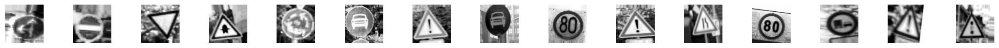

In [12]:
# Show augmented image samples
fig, axs = plt.subplots(1, 15, figsize=(20, 5))
fig.tight_layout()

for i in range(15):
    axs[i].imshow(X_batch[i].reshape(IMG_SIZE[0], IMG_SIZE[1]), cmap='gray')
    axs[i].axis('off')

plt.show()

In [13]:
#data.as_numpy_iterator().next()
train_iterator = iter(train_augmented)
X_train_batch, y_train_batch = next(train_iterator)
print("First Augmented Image:", X_train_batch[0])


First Augmented Image: [[[252.48785]
  [252.38733]
  [252.2868 ]
  ...
  [249.     ]
  [249.     ]
  [249.     ]]

 [[251.     ]
  [251.     ]
  [251.     ]
  ...
  [249.     ]
  [249.     ]
  [249.     ]]

 [[251.71652]
  [251.78352]
  [251.85054]
  ...
  [249.4229 ]
  [249.     ]
  [249.     ]]

 ...

 [[ 24.     ]
  [ 24.     ]
  [ 24.     ]
  ...
  [ 15.     ]
  [ 15.     ]
  [ 15.     ]]

 [[ 24.     ]
  [ 24.     ]
  [ 24.     ]
  ...
  [ 15.     ]
  [ 15.     ]
  [ 15.     ]]

 [[ 24.     ]
  [ 24.     ]
  [ 24.     ]
  ...
  [ 15.     ]
  [ 15.     ]
  [ 15.     ]]]


In [14]:
model = Sequential()

In [15]:

from tensorflow.keras.layers import (
    Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
)
from tensorflow.keras.regularizers import l2
# Input Layer
model.add(Input(shape=(128, 128, 1)))

# Conv Block 1
model.add(Conv2D(32, (3,3), activation='relu', padding='same', kernel_regularizer=l2(0.001)))
model.add(BatchNormalization())
model.add(Conv2D(32, (3,3), activation='relu', padding='same'))
model.add(MaxPooling2D((2,2)))
model.add(Dropout(0.25))

# Conv Block 2
model.add(Conv2D(64, (3,3), activation='relu', padding='same', kernel_regularizer=l2(0.001)))
model.add(BatchNormalization())
model.add(Conv2D(64, (3,3), activation='relu', padding='same'))
model.add(MaxPooling2D((2,2)))
model.add(Dropout(0.3))

# Conv Block 3
model.add(Conv2D(128, (3,3), activation='relu', padding='same', kernel_regularizer=l2(0.001)))
model.add(BatchNormalization())
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(MaxPooling2D((2,2)))
model.add(Dropout(0.4))

# Feature Extraction
model.add(GlobalAveragePooling2D())
model.add(Dense(128, activation='relu', kernel_regularizer=l2(0.001)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

# Output Layer
model.add(Dense(43, activation='softmax'))

In [16]:
from tensorflow.keras.optimizers import Adam
model.compile(
    Adam(learning_rate=0.001),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),  # Use SparseCategoricalCrossentropy for integer labels
    metrics=[tf.keras.metrics.SparseCategoricalAccuracy()] 
)



In [17]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 43)             │         5,547 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 309,899 (1.18 MB)

 Trainable params: 309,195 (1.18 MB)

 Non-trainable params: 704 (2.75 KB)

In [18]:
logdir='logs'

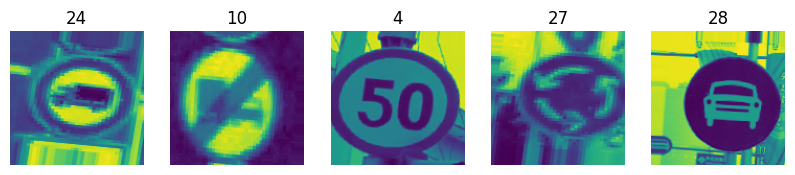

In [19]:
# Get one batch
batch = next(train_augmented)
images, labels = batch  # Unpack batch

# Get class labels mapping
class_indices = train_augmented.class_indices  # {'class_name': index}
index_to_class = {v: k for k, v in class_indices.items()}  # Reverse mapping

# Display images with class names
plt.figure(figsize=(10, 5))
for i in range(5):  # Show first 5 images
    plt.subplot(1, 5, i + 1)
    plt.imshow(images[i].astype("uint8"))  # Convert back to image format
    plt.title(index_to_class[int(labels[i])])  # Convert index to class name
    plt.axis("off")

plt.show()

In [20]:
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ReduceLROnPlateau

# Create TensorBoard callback
tensorboard_callback = TensorBoard(log_dir=logdir)

# Early stopping: stop training if validation loss doesn't improve for 4 epochs
early_stop = EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)

# Reduce learning rate if validation loss stops improving
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)

# Train the model
hist = model.fit(
    train_augmented,
    validation_data=val_generator,
    epochs=15,
    callbacks=[tensorboard_callback, early_stop, lr_scheduler]
)


c:\Users\HP\Documents\ImgageClassification\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
313/313 ━━━━━━━━━━━━━━━━━━━━ 1150s 4s/step - loss: 4.3485 - sparse_categorical_accuracy: 0.0520 - val_loss: 9.2371 - val_sparse_categorical_accuracy: 0.0160 - learning_rate: 0.0010
Epoch 2/15
313/313 ━━━━━━━━━━━━━━━━━━━━ 913s 3s/step - loss: 3.6747 - sparse_categorical_accuracy: 0.1015 - val_loss: 4.3588 - val_sparse_categorical_accuracy: 0.0697 - learning_rate: 0.0010
Epoch 3/15
313/313 ━━━━━━━━━━━━━━━━━━━━ 941s 3s/step - loss: 2.9713 - sparse_categorical_accuracy: 0.2029 - val_loss: 3.5114 - val_sparse_categorical_accuracy: 0.1253 - learning_rate: 0.0010
Epoch 4/15
313/313 ━━━━━━━━━━━━━━━━━━━━ 980s 3s/step - loss: 1.9742 - sparse_categorical_accuracy: 0.4501 - val_loss: 2.0430 - val_sparse_categorical_accuracy: 0.4592 - learning_rate: 0.0010
Epoch 5/15
313/313 ━━━━━━━━━━━━━━━━━━━━ 769s 2s/step - loss: 1.2453 - sparse_categorical_accuracy: 0.6934 - val_loss: 1.6157 - val_sparse_categorical_accuracy: 0.5857 - learning_rate: 0.0010
Epoch 6/15
313/313 ━━━━━━━━━━━━━━━━━━━━ 600s

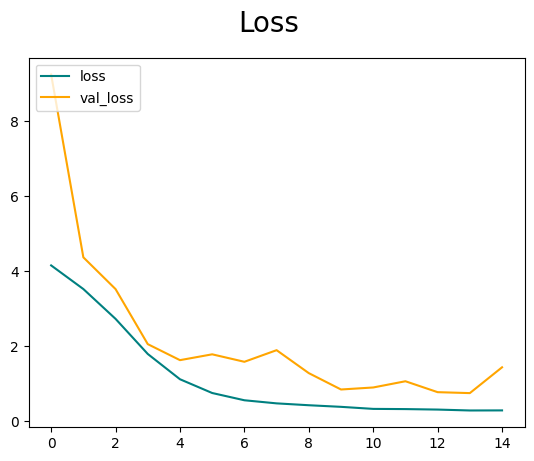

In [21]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()

In [22]:
# Print shapes for verification
print(f"Model input shape: {model.input_shape}")
print(f"Generator image shape: {train_augmented.image_shape}")

Model input shape: (None, 128, 128, 1)
Generator image shape: (128, 128, 1)


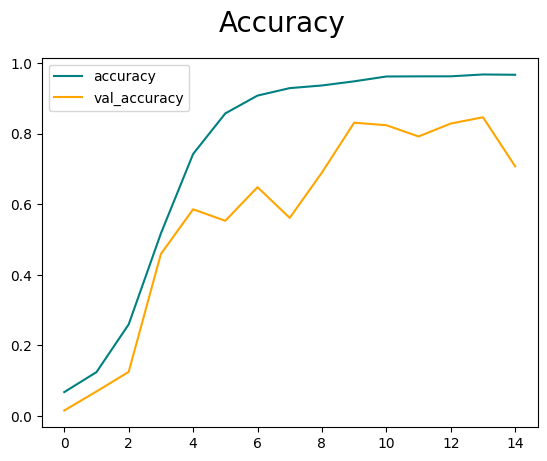

In [23]:
fig = plt.figure()
plt.plot(hist.history['sparse_categorical_accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_sparse_categorical_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.show()


In [24]:
from tensorflow.keras.metrics import Precision, Recall, SparseCategoricalAccuracy

In [25]:
pre = tf.keras.metrics.Precision()
re = tf.keras.metrics.Recall()
acc = tf.keras.metrics.SparseCategoricalAccuracy()  # Use SparseCategoricalAccuracy for multi-class

Total test batches in generator: 25
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 694ms/step
Batch 1/25 - Predicted classes: ['road work ahead', 'double bend ahead', 'Speed limit (100km/h)', 'left bend ahead', 'Roundabout mandatory', 'Traffic signals', 'Go straight', 'Speed limit (70km/h)', 'General warning', 'Traffic signals', 'No Car', 'Speed limit (20km/h)', 'road work ahead', 'No overtaking', 'no overtaking', 'uneven road', 'Go right or straight', 'priority intersection ahead', 'Go right or straight', 'road work ahead', 'General warning', 'left bend ahead', 'road work ahead', 'Go Left ', 'Closed to all vehicles', 'Zebra Crossing', 'stop', 'left bend ahead', 'Speed limit (70km/h)', 'Speed limit (5km/h)', 'Go Right', 'Roundabout mandatory']


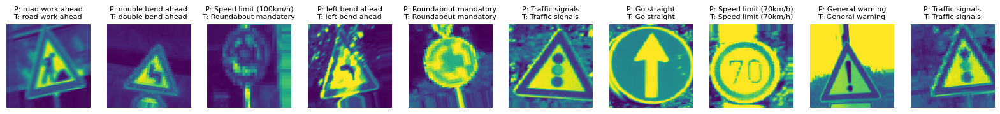

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step
Batch 2/25 - Predicted classes: ['No trucks allowed', 'Speed limit (60km/h)', 'uneven road', 'watch out for cars', 'Speed limit (100km/h)', 'priority intersection ahead', 'prohibition to double for trucks', 'uneven road', 'priority intersection ahead', 'Speed limit (40km/h)', 'road work ahead', 'double bend ahead', 'Dont Go Left', 'prohibition to double for trucks', 'Children crossing', 'General warning', 'left bend ahead', 'Traffic signals', 'Children crossing', 'Children crossing', 'move down right', 'No entry', 'No trucks allowed', 'Children crossing', 'Speed limit (50km/h)', 'Children crossing', 'Speed limit (20km/h)', 'Speed limit (20km/h)', 'Children crossing', 'watch out for cars', 'right bend ahead', 'Closed to all vehicles']


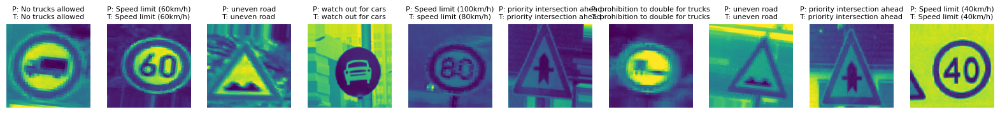

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step
Batch 3/25 - Predicted classes: ['Speed limit (70km/h)', 'Speed limit (20km/h)', 'No overtaking', 'yield (or give way)', 'priority intersection ahead', 'left bend ahead', 'right bend ahead', 'double bend ahead', 'Closed to all vehicles', 'Speed limit (70km/h)', 'No entry', 'Closed to all vehicles', 'Speed limit (100km/h)', 'Go straight', 'Speed limit (100km/h)', 'Speed limit (20km/h)', 'Go Left ', 'Speed limit (20km/h)', 'Speed limit (50km/h)', 'move down right', 'Go Left ', 'priority intersection ahead', 'Go Right', 'General warning', 'Speed limit (50km/h)', 'Speed limit (20km/h)', 'Go straight', 'Go Left ', 'uneven road', 'Slippery road', 'Speed limit (40km/h)', 'prohibition to double for trucks']


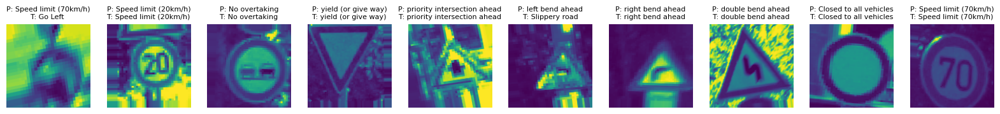

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step
Batch 4/25 - Predicted classes: ['Speed limit (40km/h)', 'Bycycles', 'Closed to all vehicles', 'watch out for cars', 'watch out for cars', 'priority intersection ahead', 'priority intersection ahead', 'Speed limit (100km/h)', 'Speed limit (20km/h)', 'no overtaking', 'move down left', 'Traffic signals', 'Closed to all vehicles', 'no overtaking', 'double bend ahead', 'Speed limit (80km/h)', 'Speed limit (30km/h)', 'watch out for cars', 'Roundabout mandatory', 'road work ahead', 'Go Left ', 'prohibition to double for trucks', 'Speed limit (5km/h)', 'watch out for cars', 'Go Left or straight', 'Go Left ', 'Go Right', 'Zebra Crossing', 'Speed limit (30km/h)', 'Bycycles', 'Narrow road ahead', 'stop']


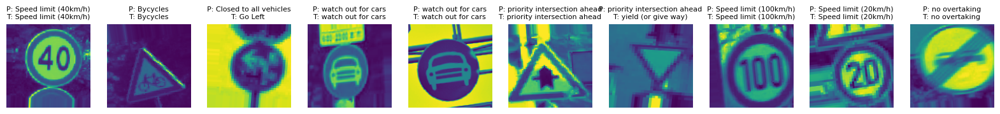

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
Batch 5/25 - Predicted classes: ['right bend ahead', 'Narrow road ahead', 'Go Left ', 'No trucks allowed', 'General warning', 'Speed limit (5km/h)', 'right bend ahead', 'right bend ahead', 'double bend ahead', 'move down left', 'Speed limit (100km/h)', 'Roundabout mandatory', 'Narrow road ahead', 'no overtaking', 'move down right', 'Roundabout mandatory', 'left bend ahead', 'no overtaking', 'road work ahead', 'Roundabout mandatory', 'speed limit (80km/h)', 'watch out for cars', 'left bend ahead', 'Roundabout mandatory', 'yield (or give way)', 'priority intersection ahead', 'priority intersection ahead', 'move down right', 'Go right or straight', 'Children crossing', 'Roundabout mandatory', 'Go Right']


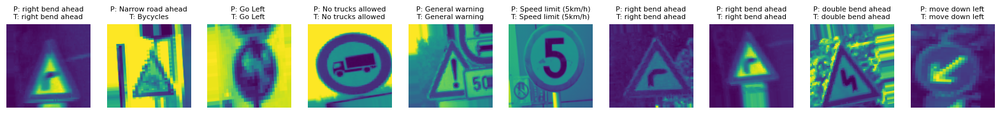

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step
Batch 6/25 - Predicted classes: ['watch out for cars', 'yield (or give way)', 'prohibition to double for trucks', 'Speed limit (100km/h)', 'Go right or straight', 'Speed limit (5km/h)', 'prohibition to double for trucks', 'Go right or straight', 'Go right or straight', 'Traffic signals', 'priority intersection ahead', 'prohibition to double for trucks', 'priority intersection ahead', 'Narrow road ahead', 'watch out for cars', 'move down right', 'Children crossing', 'move down right', 'General warning', 'Speed limit (30km/h)', 'Speed limit (60km/h)', 'stop', 'Speed limit (30km/h)', 'General warning', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'move down left', 'No overtaking', 'Go straight', 'Narrow road ahead', 'Children crossing', 'Go Left or straight']


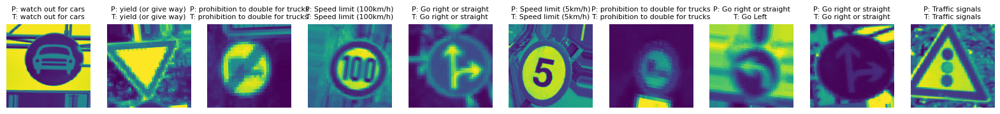

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step
Batch 7/25 - Predicted classes: ['move down right', 'Zebra Crossing', 'prohibition to double for trucks', 'Roundabout mandatory', 'Speed limit (30km/h)', 'Go Left ', 'move down left', 'uneven road', 'left bend ahead', 'road work ahead', 'Children crossing', 'speed limit (80km/h)', 'Go straight', 'Speed limit (100km/h)', 'No entry', 'Speed limit (100km/h)', 'No Car', 'Speed limit (20km/h)', 'Speed limit (70km/h)', 'Narrow road ahead', 'no overtaking', 'No Car', 'Go right or straight', 'Closed to all vehicles', 'No entry', 'Closed to all vehicles', 'right bend ahead', 'no overtaking', 'No overtaking', 'Closed to all vehicles', 'move down left', 'uneven road']


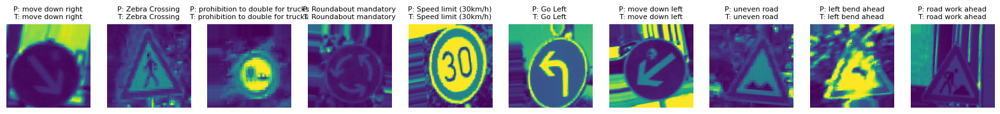

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step
Batch 8/25 - Predicted classes: ['Speed limit (100km/h)', 'road work ahead', 'Children crossing', 'No Car', 'Go right or straight', 'uneven road', 'Go right or straight', 'Speed limit (100km/h)', 'Go straight', 'double bend ahead', 'Speed limit (50km/h)', 'Speed limit (20km/h)', 'Speed limit (40km/h)', 'Traffic signals', 'watch out for cars', 'Go straight', 'Speed limit (30km/h)', 'left bend ahead', 'right bend ahead', 'move down left', 'Go Right', 'No overtaking', 'right bend ahead', 'Traffic signals', 'Closed to all vehicles', 'Go right or straight', 'Speed limit (80km/h)', 'left bend ahead', 'Go Left ', 'road work ahead', 'move down right', 'Bycycles']


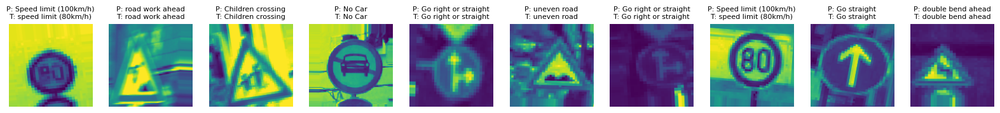

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step
Batch 9/25 - Predicted classes: ['move down left', 'double bend ahead', 'prohibition to double for trucks', 'Go right or straight', 'double bend ahead', 'Speed limit (40km/h)', 'priority intersection ahead', 'priority intersection ahead', 'Go Right', 'No overtaking', 'No trucks allowed', 'move down right', 'road work ahead', 'Traffic signals', 'move down right', 'Speed limit (40km/h)', 'No overtaking', 'Speed limit (50km/h)', 'left bend ahead', 'speed limit (80km/h)', 'Closed to all vehicles', 'Traffic signals', 'Go right or straight', 'Roundabout mandatory', 'Speed limit (80km/h)', 'stop', 'Speed limit (30km/h)', 'General warning', 'Speed limit (80km/h)', 'General warning', 'Speed limit (80km/h)', 'Go right or straight']


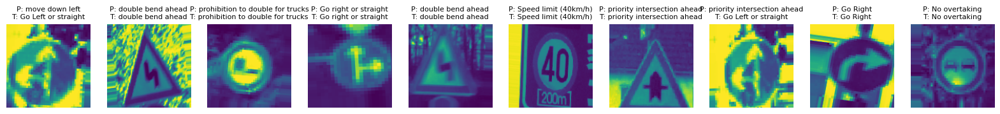

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step
Batch 10/25 - Predicted classes: ['prohibition to double for trucks', 'Speed limit (5km/h)', 'Speed limit (30km/h)', 'priority intersection ahead', 'Dont Go Left', 'watch out for cars', 'Speed limit (30km/h)', 'No overtaking', 'Go right or straight', 'right bend ahead', 'Narrow road ahead', 'Closed to all vehicles', 'Go right or straight', 'no overtaking', 'left bend ahead', 'move down right', 'yield (or give way)', 'Roundabout mandatory', 'road work ahead', 'left bend ahead', 'General warning', 'Children crossing', 'priority intersection ahead', 'No Car', 'Go straight', 'Closed to all vehicles', 'General warning', 'prohibition to double for trucks', 'prohibition to double for trucks', 'Speed limit (70km/h)', 'prohibition to double for trucks', 'Roundabout mandatory']


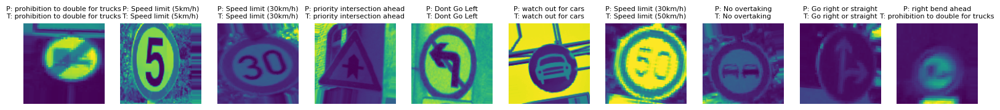

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step
Batch 11/25 - Predicted classes: ['Narrow road ahead', 'Speed limit (80km/h)', 'priority intersection ahead', 'No overtaking', 'Roundabout mandatory', 'move down right', 'Speed limit (60km/h)', 'Speed limit (40km/h)', 'Closed to all vehicles', 'No entry', 'Roundabout mandatory', 'General warning', 'Go Left ', 'road work ahead', 'General warning', 'No trucks allowed', 'Go Left ', 'Go straight', 'move down right', 'No overtaking', 'Narrow road ahead', 'Roundabout mandatory', 'No trucks allowed', 'No trucks allowed', 'Speed limit (70km/h)', 'right bend ahead', 'move down left', 'Speed limit (70km/h)', 'Go straight', 'double bend ahead', 'priority intersection ahead', 'Narrow road ahead']


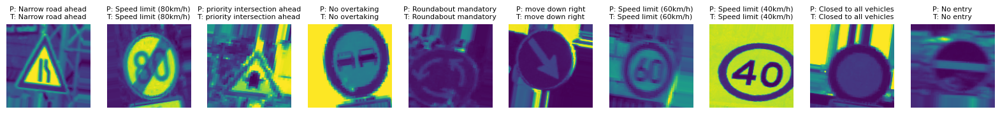

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step
Batch 12/25 - Predicted classes: ['Speed limit (20km/h)', 'Zebra Crossing', 'Traffic signals', 'Go Right', 'Speed limit (50km/h)', 'priority intersection ahead', 'move down right', 'prohibition to double for trucks', 'No trucks allowed', 'speed limit (80km/h)', 'uneven road', 'Roundabout mandatory', 'No overtaking', 'stop', 'left bend ahead', 'Go Left ', 'Speed limit (70km/h)', 'uneven road', 'No trucks allowed', 'priority intersection ahead', 'uneven road', 'Speed limit (50km/h)', 'Speed limit (5km/h)', 'Speed limit (50km/h)', 'Bycycles', 'priority intersection ahead', 'Go straight', 'Children crossing', 'Speed limit (20km/h)', 'yield (or give way)', 'double bend ahead', 'Go Right']


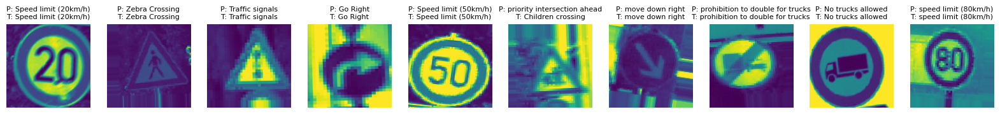

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step
Batch 13/25 - Predicted classes: ['Speed limit (60km/h)', 'prohibition to double for trucks', 'Children crossing', 'right bend ahead', 'Closed to all vehicles', 'stop', 'Go right or straight', 'General warning', 'left bend ahead', 'stop', 'move down left', 'No overtaking', 'Speed limit (100km/h)', 'priority intersection ahead', 'left bend ahead', 'Children crossing', 'No overtaking', 'no overtaking', 'Zebra Crossing', 'Bycycles', 'Go Left ', 'Speed limit (100km/h)', 'Speed limit (100km/h)', 'road work ahead', 'watch out for cars', 'Dont Go Left', 'right bend ahead', 'Speed limit (70km/h)', 'Dont Go Left', 'move down left', 'Go Left ', 'Traffic signals']


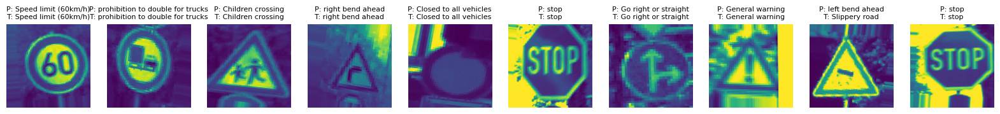

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step
Batch 14/25 - Predicted classes: ['Speed limit (30km/h)', 'Dont Go Left', 'Bycycles', 'stop', 'road work ahead', 'left bend ahead', 'Traffic signals', 'prohibition to double for trucks', 'double bend ahead', 'No trucks allowed', 'Speed limit (30km/h)', 'double bend ahead', 'Slippery road', 'double bend ahead', 'Speed limit (30km/h)', 'right bend ahead', 'Zebra Crossing', 'stop', 'right bend ahead', 'Go Right', 'road work ahead', 'watch out for cars', 'move down right', 'Closed to all vehicles', 'Go Right', 'right bend ahead', 'prohibition to double for trucks', 'uneven road', 'Bycycles', 'left bend ahead', 'move down left', 'Speed limit (30km/h)']


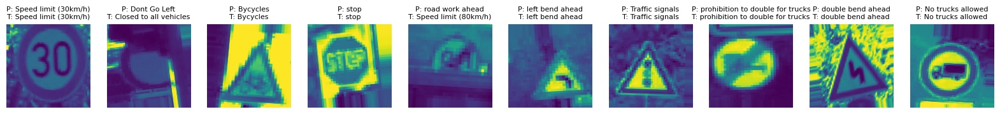

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step
Batch 15/25 - Predicted classes: ['Children crossing', 'Children crossing', 'road work ahead', 'move down left', 'No entry', 'Go Left ', 'priority intersection ahead', 'Go Left ', 'Speed limit (100km/h)', 'priority intersection ahead', 'Speed limit (80km/h)', 'watch out for cars', 'Go Left ', 'Closed to all vehicles', 'road work ahead', 'yield (or give way)', 'No Car', 'double bend ahead', 'Roundabout mandatory', 'road work ahead', 'road work ahead', 'no overtaking', 'Bycycles', 'Roundabout mandatory', 'Go right or straight', 'road work ahead', 'Children crossing', 'Speed limit (70km/h)', 'No entry', 'Speed limit (100km/h)', 'Speed limit (80km/h)', 'Go right or straight']


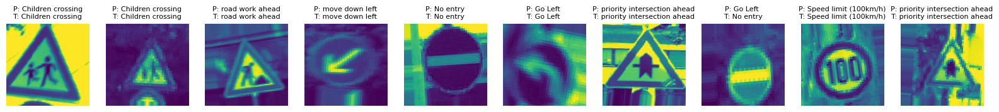

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step
Batch 16/25 - Predicted classes: ['Go straight', 'Go Right', 'Zebra Crossing', 'watch out for cars', 'Narrow road ahead', 'no overtaking', 'watch out for cars', 'Speed limit (100km/h)', 'stop', 'Zebra Crossing', 'Speed limit (30km/h)', 'Children crossing', 'Dont Go Left', 'No trucks allowed', 'watch out for cars', 'Go right or straight', 'Speed limit (70km/h)', 'no overtaking', 'Roundabout mandatory', 'Children crossing', 'No Car', 'Go Left ', 'uneven road', 'Closed to all vehicles', 'Roundabout mandatory', 'yield (or give way)', 'Roundabout mandatory', 'double bend ahead', 'Roundabout mandatory', 'uneven road', 'priority intersection ahead', 'move down right']


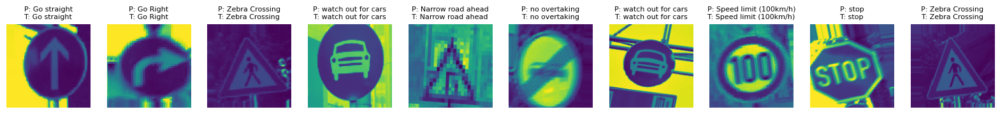

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step
Batch 17/25 - Predicted classes: ['double bend ahead', 'Roundabout mandatory', 'General warning', 'road work ahead', 'move down left', 'Speed limit (80km/h)', 'Children crossing', 'No trucks allowed', 'Speed limit (80km/h)', 'Speed limit (40km/h)', 'watch out for cars', 'Closed to all vehicles', 'right bend ahead', 'priority intersection ahead', 'Zebra Crossing', 'watch out for cars', 'No entry', 'Go Right', 'prohibition to double for trucks', 'stop', 'Roundabout mandatory', 'Closed to all vehicles', 'Roundabout mandatory', 'Traffic signals', 'Speed limit (80km/h)', 'Speed limit (30km/h)', 'No trucks allowed', 'left bend ahead', 'Closed to all vehicles', 'yield (or give way)', 'priority intersection ahead', 'Narrow road ahead']


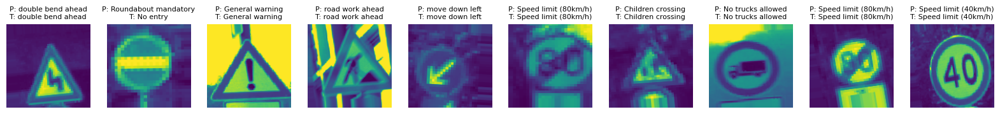

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step
Batch 18/25 - Predicted classes: ['road work ahead', 'Speed limit (100km/h)', 'Narrow road ahead', 'move down left', 'Speed limit (20km/h)', 'uneven road', 'prohibition to double for trucks', 'uneven road', 'left bend ahead', 'No trucks allowed', 'Speed limit (100km/h)', 'Speed limit (70km/h)', 'watch out for cars', 'Bycycles', 'Speed limit (60km/h)', 'road work ahead', 'Roundabout mandatory', 'watch out for cars', 'Closed to all vehicles', 'Closed to all vehicles', 'right bend ahead', 'priority intersection ahead', 'Slippery road', 'Speed limit (40km/h)', 'right bend ahead', 'Speed limit (80km/h)', 'speed limit (80km/h)', 'left bend ahead', 'Speed limit (50km/h)', 'prohibition to double for trucks', 'Roundabout mandatory', 'move down left']


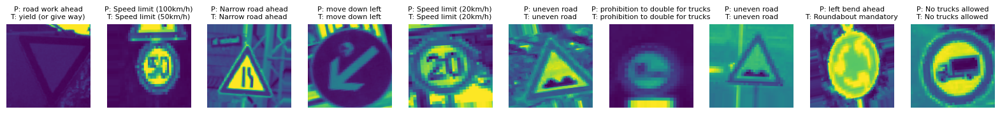

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step
Batch 19/25 - Predicted classes: ['No overtaking', 'speed limit (80km/h)', 'Closed to all vehicles', 'stop', 'watch out for cars', 'Go straight', 'double bend ahead', 'Speed limit (50km/h)', 'Speed limit (20km/h)', 'Speed limit (30km/h)', 'Speed limit (100km/h)', 'priority intersection ahead', 'uneven road', 'Speed limit (30km/h)', 'Go right or straight', 'road work ahead', 'double bend ahead', 'stop', 'Traffic signals', 'Speed limit (50km/h)', 'Speed limit (40km/h)', 'stop', 'Go right or straight', 'move down left', 'left bend ahead', 'Speed limit (100km/h)', 'Go Right', 'Closed to all vehicles', 'prohibition to double for trucks', 'Dont Go Left', 'no overtaking', 'Go Right']


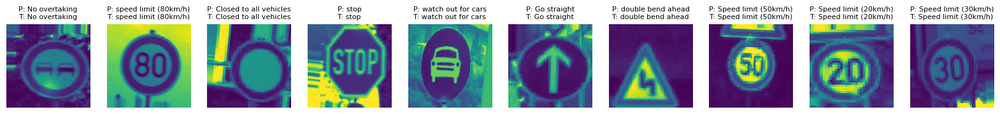

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
Batch 20/25 - Predicted classes: ['Narrow road ahead', 'prohibition to double for trucks', 'stop', 'Speed limit (100km/h)', 'road work ahead', 'Speed limit (100km/h)', 'Closed to all vehicles', 'Speed limit (20km/h)', 'Speed limit (70km/h)', 'Go Left ', 'Narrow road ahead', 'Speed limit (50km/h)', 'watch out for cars', 'right bend ahead', 'double bend ahead', 'right bend ahead', 'Children crossing', 'move down left', 'Roundabout mandatory', 'Speed limit (70km/h)', 'Dont Go Left', 'watch out for cars', 'move down left', 'Zebra Crossing', 'No overtaking', 'Speed limit (100km/h)', 'Dont Go Left', 'Speed limit (30km/h)', 'Speed limit (40km/h)', 'Slippery road', 'move down right', 'Children crossing']


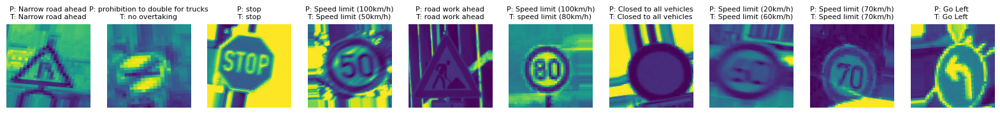

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
Batch 21/25 - Predicted classes: ['road work ahead', 'Speed limit (100km/h)', 'Speed limit (40km/h)', 'right bend ahead', 'No trucks allowed', 'prohibition to double for trucks', 'Speed limit (40km/h)', 'Speed limit (20km/h)', 'prohibition to double for trucks', 'Children crossing', 'Speed limit (40km/h)', 'watch out for cars', 'Speed limit (40km/h)', 'road work ahead', 'move down right', 'Narrow road ahead', 'Go Right', 'prohibition to double for trucks', 'Speed limit (70km/h)', 'Speed limit (80km/h)', 'Children crossing', 'Bycycles', 'Go straight', 'No overtaking', 'Speed limit (80km/h)', 'No overtaking', 'No Car', 'right bend ahead', 'uneven road', 'No overtaking', 'Closed to all vehicles', 'No Car']


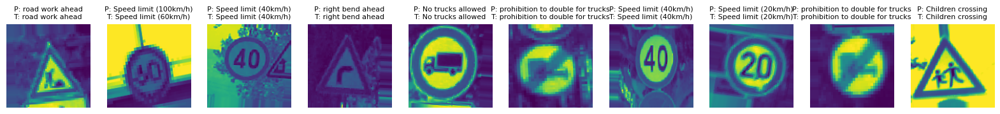

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step
Batch 22/25 - Predicted classes: ['Speed limit (50km/h)', 'Speed limit (40km/h)', 'move down left', 'prohibition to double for trucks', 'prohibition to double for trucks', 'watch out for cars', 'Children crossing', 'Zebra Crossing', 'Speed limit (30km/h)', 'Speed limit (40km/h)', 'priority intersection ahead', 'Speed limit (30km/h)', 'move down right', 'Speed limit (30km/h)', 'right bend ahead', 'Speed limit (100km/h)', 'Speed limit (80km/h)', 'Slippery road', 'left bend ahead', 'double bend ahead', 'Go Left ', 'prohibition to double for trucks', 'road work ahead', 'Speed limit (40km/h)', 'road work ahead', 'road work ahead', 'Speed limit (5km/h)', 'Speed limit (20km/h)', 'Speed limit (100km/h)', 'Speed limit (40km/h)', 'stop', 'speed limit (80km/h)']


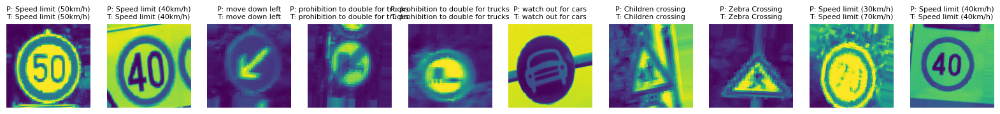

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step
Batch 23/25 - Predicted classes: ['Speed limit (100km/h)', 'move down right', 'stop', 'left bend ahead', 'Go Right', 'Speed limit (80km/h)', 'No overtaking', 'Speed limit (100km/h)', 'Closed to all vehicles', 'Go Left ', 'Go straight', 'Speed limit (50km/h)', 'left bend ahead', 'move down left', 'prohibition to double for trucks', 'General warning', 'prohibition to double for trucks', 'watch out for cars', 'Slippery road', 'Roundabout mandatory', 'prohibition to double for trucks', 'Children crossing', 'Zebra Crossing', 'Children crossing', 'Speed limit (100km/h)', 'Go right or straight', 'Traffic signals', 'Zebra Crossing', 'Dont Go Left', 'uneven road', 'No trucks allowed', 'Roundabout mandatory']


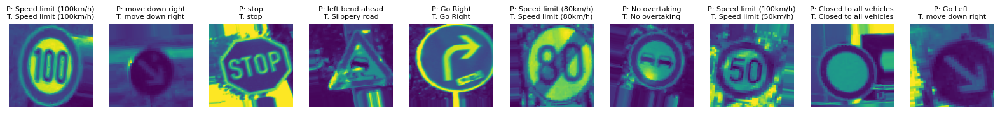

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
Batch 24/25 - Predicted classes: ['road work ahead', 'watch out for cars', 'Zebra Crossing', 'stop', 'Traffic signals', 'Closed to all vehicles', 'General warning', 'Speed limit (60km/h)', 'Go Right', 'Dont Go Left', 'Speed limit (30km/h)', 'watch out for cars', 'Speed limit (100km/h)', 'Speed limit (100km/h)', 'Narrow road ahead', 'Go right or straight', 'move down right', 'No entry', 'Dont Go Left', 'Narrow road ahead', 'road work ahead', 'priority intersection ahead', 'Go Left ', 'left bend ahead', 'prohibition to double for trucks', 'Go Right', 'watch out for cars', 'Go Right', 'left bend ahead', 'General warning', 'uneven road', 'Go straight']


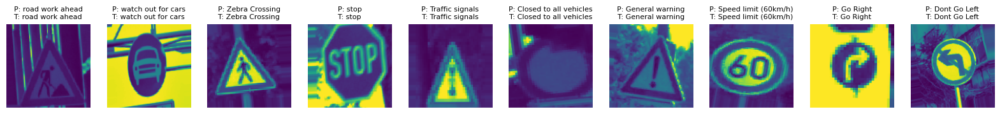

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Batch 25/25 - Predicted classes: ['road work ahead', 'Go right or straight', 'Speed limit (80km/h)', 'left bend ahead', 'Zebra Crossing', 'right bend ahead', 'Go Left ', 'uneven road', 'Speed limit (60km/h)', 'Children crossing', 'Traffic signals', 'Speed limit (30km/h)', 'Roundabout mandatory', 'yield (or give way)', 'prohibition to double for trucks', 'Speed limit (70km/h)', 'no overtaking', 'Speed limit (100km/h)', 'Dont Go Left', 'Speed limit (100km/h)', 'Speed limit (50km/h)', 'uneven road', 'Dont Go Left', 'Speed limit (80km/h)', 'Bycycles', 'Bycycles', 'Go right or straight']


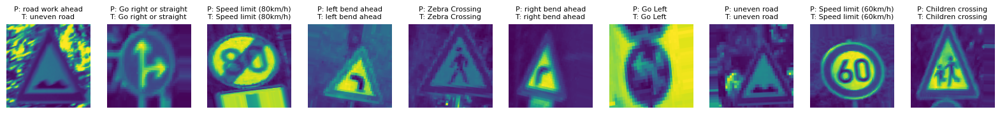

In [26]:
import matplotlib.pyplot as plt

# Print total test batches
print(f"Total test batches in generator: {len(test_generator)}")

# Iterate over all test batches
for i in range(len(test_generator)):
    X, y = test_generator[i]  # Access batch using index
    yhat = model.predict(X)

    # Ensure correct label shapes
    y = tf.squeeze(y).numpy().astype(int)  # Convert y to integer values
    yhat = tf.argmax(yhat, axis=-1).numpy()  # Convert probabilities to class index

    # Convert indices to class names
    predicted_classes = [mapped_class_names[i] for i in yhat]
    true_classes = [mapped_class_names[int(i)] for i in y]  # Convert y to int before indexing

    print(f'Batch {i+1}/{len(test_generator)} - Predicted classes: {predicted_classes}')

    # Display first 10 images of the batch with predictions
    fig, axes = plt.subplots(1, 10, figsize=(20, 2))  # Reduce height to fit all images
    for j in range(10):
        axes[j].imshow(X[j])  # Display image
        axes[j].axis('off')
        axes[j].set_title(f"P: {predicted_classes[j]}\nT: {true_classes[j]}", fontsize=8)
    
    plt.show()

    # Update evaluation metrics
    pre.update_state(y, yhat)
    re.update_state(y, yhat)
    acc.update_state(y, yhat)


In [27]:
print(f"Precison:{pre.result().numpy()}, Recall:{re.result().numpy()}, Accuracy:{acc.result().numpy()}")

Precison:1.0, Recall:1.0, Accuracy:0.025157231837511063



=== Testing image: test_images\00045.png ===


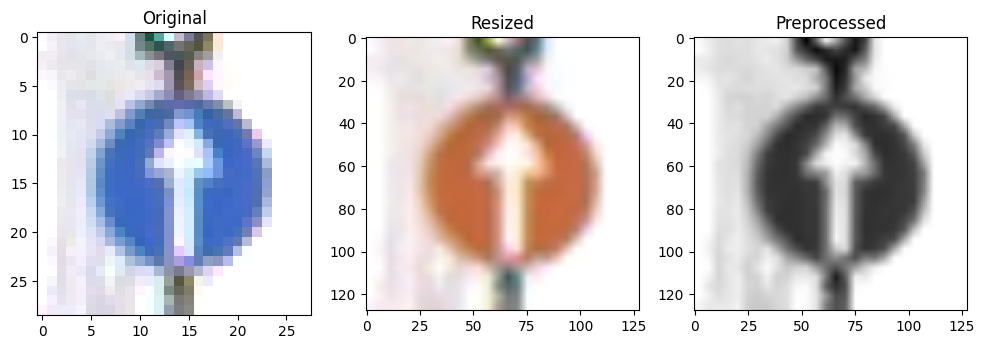


Top 3 predictions:
Class 19 (right bend ahead): 22.44%
Class 33 (Go right or straight): 21.10%
Class 37 (Closed to all vehicles): 18.71%

=== Testing image: test_images\00229.png ===


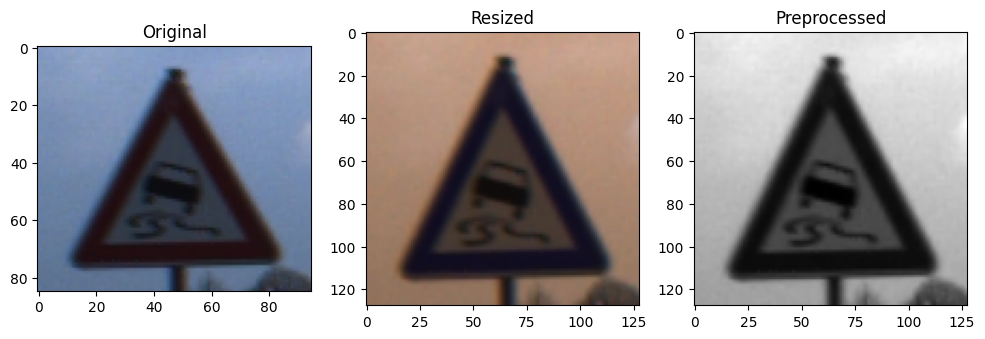


Top 3 predictions:
Class 28 (road work ahead): 64.05%
Class 22 (Slippery road): 22.77%
Class 18 (left bend ahead): 4.30%

=== Testing image: test_images\00228.png ===


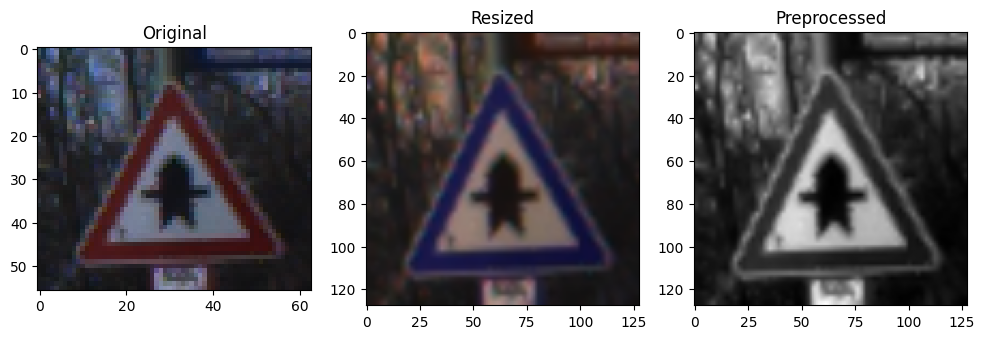


Top 3 predictions:
Class 4 (priority intersection ahead): 99.70%
Class 19 (right bend ahead): 0.14%
Class 18 (left bend ahead): 0.14%

=== Testing image: test_images\00023.png ===


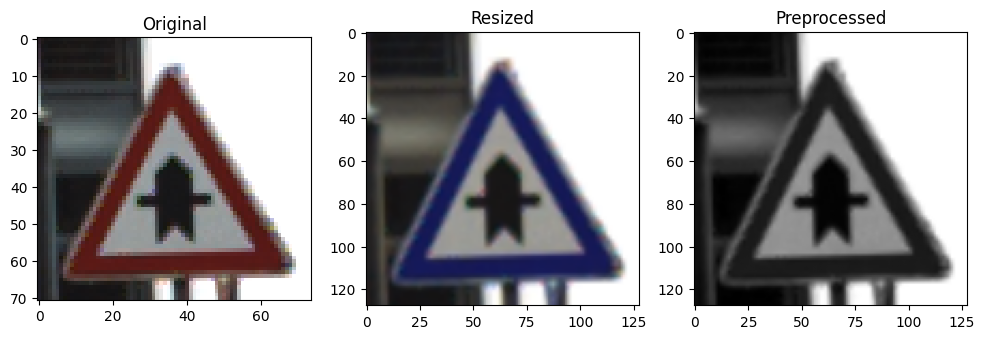


Top 3 predictions:
Class 4 (priority intersection ahead): 100.00%
Class 18 (left bend ahead): 0.00%
Class 19 (right bend ahead): 0.00%

=== Testing image: test_images\00203.png ===


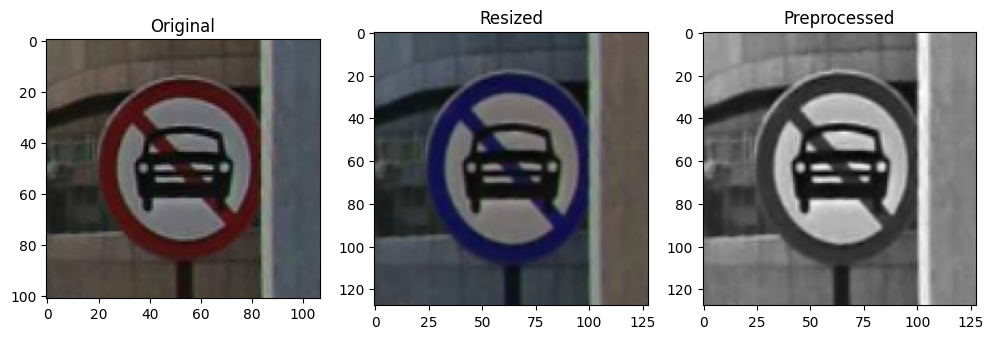


Top 3 predictions:
Class 8 (No Car): 99.87%
Class 19 (right bend ahead): 0.04%
Class 16 (prohibition to double for trucks): 0.03%


In [28]:

def preprocess_input_image(image_path):
    """Preprocess input image to match test generator format"""
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not load image at {image_path}")
    
    resize = tf.image.resize(img, (128, 128))
    grayscale = cv2.cvtColor(resize.numpy(), cv2.COLOR_BGR2GRAY)
    scaled = ((grayscale / 255.0) * 70) + 13
    processed = np.expand_dims(scaled, axis=-1)
    processed = np.expand_dims(processed, axis=0)
    return processed

def test_random_images(directory, num_images=5):
    """Randomly selects images from a directory and predicts them"""
    # Get all image files in the directory
    image_files = [os.path.join(directory, f) for f in os.listdir(directory) if f.endswith(('.png', '.jpg', '.jpeg'))]
    
    if len(image_files) < num_images:
        print("Not enough images in the directory!")
        return

    # Select random images
    selected_images = random.sample(image_files, num_images)

    for path in selected_images:
        print(f"\n=== Testing image: {path} ===")
        
        # Load and display original image
        img = cv2.imread(path)
        plt.figure(figsize=(12, 4))
        
        plt.subplot(1, 3, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title("Original")
        
        # Resize image
        resize = tf.image.resize(img, (128, 128))
        plt.subplot(1, 3, 2)
        plt.imshow(resize.numpy().astype(int))
        plt.title("Resized")
        
        # Process image
        input_img = preprocess_input_image(path)
        plt.subplot(1, 3, 3)
        plt.imshow(input_img[0, :, :, 0], cmap='gray')
        plt.title("Preprocessed")
        plt.show()
        
        # Make prediction
        pred = model.predict(input_img, verbose=0)
        top_3 = np.argsort(pred[0])[-3:][::-1]
        
        print("\nTop 3 predictions:")
        for idx in top_3:
            print(f"Class {idx} ({mapped_class_names[idx]}): {pred[0][idx]*100:.2f}%")

# Example usage: Change "test_images/" to your actual test image directory
test_random_images("test_images")


In [29]:
import glob
import keras.saving

def get_next_version():
    """Get next version number for model files"""
    # Get all files with 'imageclassifier__' prefix
    pattern = os.path.join('models', 'imageclassifier__*.h5')
    existing_files = glob.glob(pattern)
    
    # Extract version numbers
    versions = []
    for file in existing_files:
        try:
            version = int(file.split('__')[-1].split('.')[0])
            versions.append(version)
        except ValueError:
            continue
    
    # Return next version number (1 if no existing files)
    return max(versions, default=0) + 1

# Get next version number
next_version = get_next_version()
print(f"Saving model version: {next_version}")

# Save model in both formats with incremented version
model_name = f'imageclassifier__{next_version}'
keras.saving.save_model(model, os.path.join('models', f'{model_name}.h5'))
keras.saving.save_model(model, os.path.join('models', f'{model_name}.keras'))

print(f"Model saved as {model_name}.h5 and {model_name}.keras")

Saving model version: 4
Model saved as imageclassifier__4.h5 and imageclassifier__4.keras


Selected model: C:\Users\HP\Documents\ImgageClassification\models\imageclassifier__4.h5


Model loaded successfully

=== Testing image: 000_0003_j - Copy.png ===


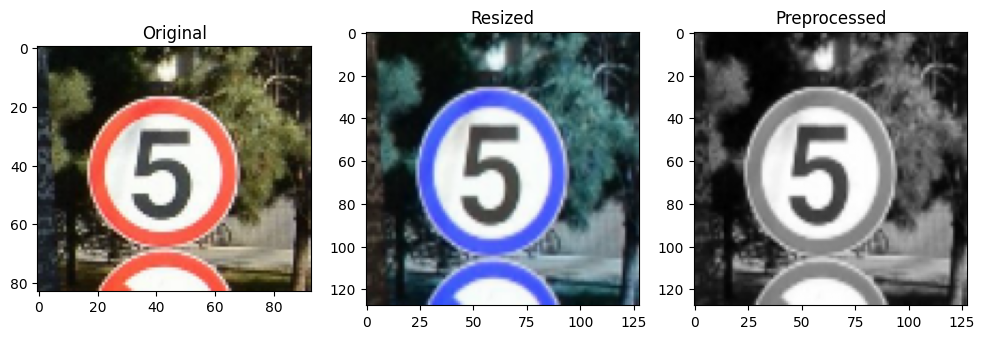


Predicted Class: Speed limit (5km/h) (80.54%)


In [30]:
from tensorflow.keras.models import load_model

import win32gui
import win32con
import win32ui


def select_model_file():
    """Open Windows file explorer to select model file"""
    try:
        # Set up file dialog parameters
        file_filter = "Model files (*.h5;*.keras)|*.h5;*.keras|All files (*.*)|*.*||"
        dialog = win32ui.CreateFileDialog(1)  # 1 = Open dialog
        dialog.SetOFNInitialDir(os.path.abspath('./models'))  # Start in models directory
        dialog.DoModal()
        
        # Get selected file path
        model_path = dialog.GetPathName()
        if not model_path:
            raise ValueError("No model file selected")
            
        print(f"Selected model: {model_path}")
        return model_path
        
    except Exception as e:
        print(f"Error selecting model: {str(e)}")
        raise

# Load model using file dialog
try:
    model_path = select_model_file()
    model = load_model(model_path)
    print("Model loaded successfully")
except Exception as e:
    print(f"Error loading model: {str(e)}")
    raise



# Function to preprocess an input image
def preprocess_input_image(image_path):
    """Preprocess input image for model prediction"""
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not load image at {image_path}")
    
    resize = tf.image.resize(img, (128, 128))
    grayscale = cv2.cvtColor(resize.numpy(), cv2.COLOR_BGR2GRAY)
    scaled = ((grayscale / 255.0) * 70) + 13
    processed = np.expand_dims(scaled, axis=-1)  # Add channel dimension
    processed = np.expand_dims(processed, axis=0)  # Add batch dimension
    return processed

# Function to test a single image
def test_single_image(image_path):
    """Load, preprocess, and predict a single image"""
    print(f"\n=== Testing image: {image_path} ===")

    # Load original image
    img = cv2.imread(image_path)
    plt.figure(figsize=(12, 4))

    # Display original image
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original")

    # Resize image
    resize = tf.image.resize(img, (128, 128))
    plt.subplot(1, 3, 2)
    plt.imshow(resize.numpy().astype(int))
    plt.title("Resized")

    # Preprocess image
    input_img = preprocess_input_image(image_path)
    plt.subplot(1, 3, 3)
    plt.imshow(input_img[0, :, :, 0], cmap='gray')
    plt.title("Preprocessed")
    plt.show()

    # Make prediction
    pred = model.predict(input_img, verbose=0)
    predicted_index = np.argmax(pred)
    predicted_class = mapped_class_names[predicted_index]

    print(f"\nPredicted Class: {predicted_class} ({pred[0][predicted_index] * 100:.2f}%)")


test_single_image("000_0003_j - Copy.png")


In [31]:
from tensorflow.keras.models import load_model

import win32gui
import win32con
import win32ui
import os

# Load TensorFlow Model
def select_model_file():
    """Open Windows file explorer to select model file"""
    try:
        # Set up file dialog parameters
        file_filter = "Model files (*.h5;*.keras)|*.h5;*.keras|All files (*.*)|*.*||"
        dialog = win32ui.CreateFileDialog(1)  # 1 = Open dialog
        dialog.SetOFNInitialDir(os.path.abspath('./models'))  # Start in models directory
        dialog.DoModal()
        
        # Get selected file path
        model_path = dialog.GetPathName()
        if not model_path:
            raise ValueError("No model file selected")
            
        print(f"Selected model: {model_path}")
        return model_path
        
    except Exception as e:
        print(f"Error selecting model: {str(e)}")
        raise

# Load model using file dialog
try:
    model_path = select_model_file()
    model = load_model(model_path)
    print("Model loaded successfully")
except Exception as e:
    print(f"Error loading model: {str(e)}")
    raise


# Ensure label_mapping is defined
# label_mapping should be a dictionary mapping numeric indices to class names
mapped_class_names = [label_mapping[int(i)] for i in class_names]  # Already mapped

# Preprocessing Function
# Update preprocessing function to match test set scaling
def preprocess_image(img):
    """Preprocesses the input image for model prediction."""
    img = cv2.resize(img, (128, 128))  # Resize
    grayscale = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    # Scale to match test set range [13, 83]
    scaled = ((grayscale / 255.0) * 70) + 13
    processed = np.expand_dims(scaled, axis=-1)  # Add channel dimension
    processed = np.expand_dims(processed, axis=0)  # Add batch dimension
    return processed

def capture_and_classify():
    """Capture and classify images from webcam with error handling"""
    print("Initializing webcam...")
    cap = cv2.VideoCapture(0)
    
    if not cap.isOpened():
        print("Error: Could not open webcam")
        return
    
    frameWidth, frameHeight = 640, 480
    cap.set(cv2.CAP_PROP_FRAME_WIDTH, frameWidth)
    cap.set(cv2.CAP_PROP_FRAME_HEIGHT, frameHeight)
    cap.set(cv2.CAP_PROP_BRIGHTNESS, 180)
    
    print("Webcam initialized successfully")
    print("Press 'q' to quit")
    
    # Lower threshold to show more predictions
    threshold = 0.3  # Reduced from 0.75
    font = cv2.FONT_HERSHEY_SIMPLEX
    frame_count = 0

    while True:
        success, imgOriginal = cap.read()
        frame_count += 1
        
        if not success:
            print(f"Error: Failed to grab frame {frame_count}")
            break
            
        try:
            # Preprocess captured image
            input_img = preprocess_image(imgOriginal)
            
            # Make prediction
            predictions = model.predict(input_img, verbose=0)
            
            # Get top 3 predictions
            top_3_indices = np.argsort(predictions[0])[-3:][::-1]
            top_3_probs = predictions[0][top_3_indices]
            
            # Always show top prediction
            className = mapped_class_names[top_3_indices[0]]
            probabilityValue = top_3_probs[0]
            
            # Draw predictions (always show, removed threshold check)
            cv2.putText(imgOriginal, f"CLASS: {className}", 
                      (20, 35), font, 0.75, (0, 0, 255), 2, cv2.LINE_AA)
            cv2.putText(imgOriginal, f"PROB: {probabilityValue:.2%}", 
                      (20, 75), font, 0.75, (0, 0, 255), 2, cv2.LINE_AA)
            
            # Show top 3 on frame
            y_offset = 115
            for i, (idx, prob) in enumerate(zip(top_3_indices[1:], top_3_probs[1:])):
                cv2.putText(imgOriginal, f"#{i+2}: {mapped_class_names[idx]} ({prob:.2%})", 
                          (20, y_offset), font, 0.5, (0, 255, 0), 1, cv2.LINE_AA)
                y_offset += 30
            
            # Show the frame
            cv2.imshow("Traffic Sign Classification", imgOriginal)
            
        except Exception as e:
            print(f"Error processing frame {frame_count}: {str(e)}")
            break
        
        if cv2.waitKey(1) & 0xFF == ord('q'):
            print("User requested quit")
            break
    
    print(f"Total frames processed: {frame_count}")
    cap.release()
    cv2.destroyAllWindows()

# Run capture
print("Starting traffic sign classifier...")
capture_and_classify()

Selected model: C:\Users\HP\Documents\ImgageClassification\models\imageclassifier__4.h5


Model loaded successfully
Starting traffic sign classifier...
Initializing webcam...
Webcam initialized successfully
Press 'q' to quit
User requested quit
Total frames processed: 195


Starting model evaluation...
Generating predictions...

=== Model Evaluation Metrics ===


c:\Users\HP\Documents\ImgageClassification\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Overall Model Performance:
Test Accuracy: 84.40%
Test Loss: 0.7316
Weighted F1-Score: 83.61%
Weighted Precision: 88.07%
Weighted Recall: 84.40%

Detailed Classification Report:
                                  precision    recall  f1-score   support

             Speed limit (5km/h)       1.00      1.00      1.00         7
                        No entry       1.00      0.53      0.69        17
prohibition to double for trucks       0.93      0.93      0.93        15
                    Dont Go Left       0.57      1.00      0.73         8
     priority intersection ahead       0.70      1.00      0.82        21
                        Go Right       1.00      0.95      0.97        20
                            stop       0.89      1.00      0.94        16
                  move down left       0.95      1.00      0.97        19
                          No Car       1.00      1.00      1.00         9
                 move down right       0.76      0.73      0.74        22
       

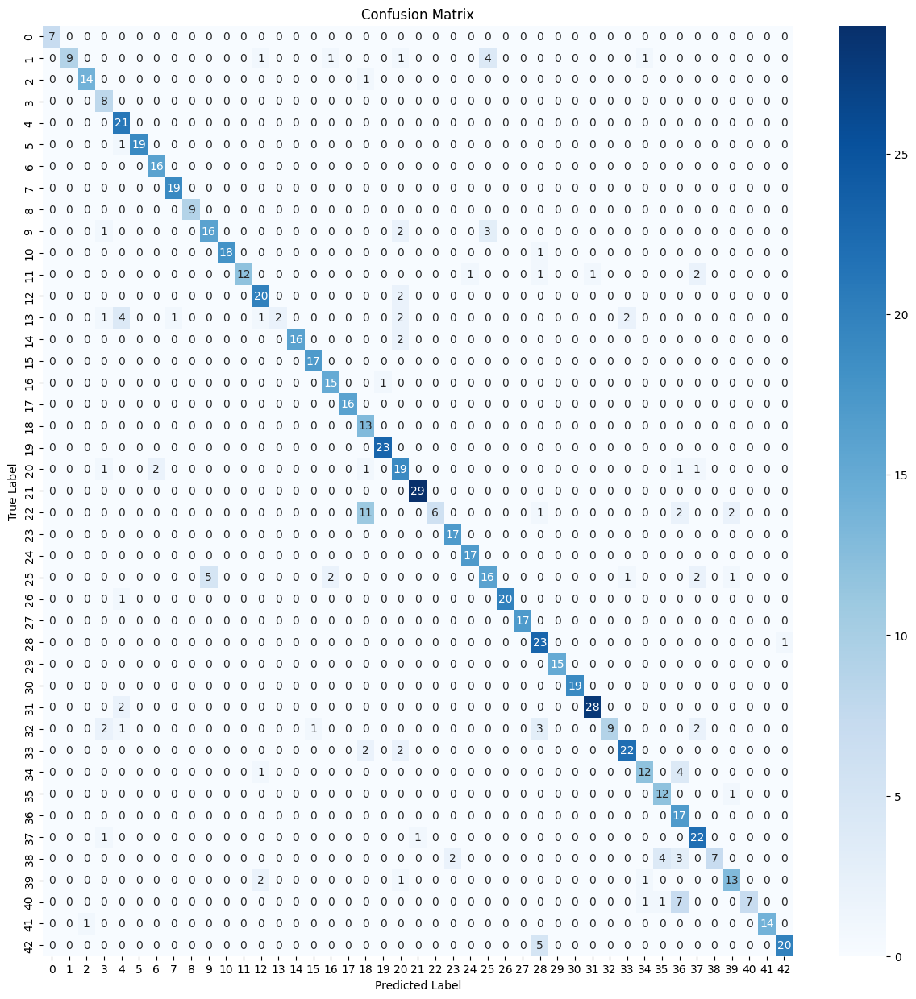


Per-class Performance:
Speed limit (5km/h): 1.0000
No entry: 0.5294
prohibition to double for trucks: 0.9333
Dont Go Left: 1.0000
priority intersection ahead: 1.0000
Go Right: 0.9500
stop: 1.0000
move down left: 1.0000
No Car: 1.0000
move down right: 0.7273
Speed limit (80km/h): 0.9474
Bycycles: 0.7059
Speed limit (30km/h): 0.9091
Go Left or straight: 0.1538
Go straight: 0.8889
General warning: 1.0000
prohibition to double for trucks: 0.9375
No trucks allowed: 1.0000
left bend ahead: 1.0000
right bend ahead: 1.0000
Roundabout mandatory: 0.7600
watch out for cars: 1.0000
Slippery road: 0.2727
Speed limit (40km/h): 1.0000
Narrow road ahead: 1.0000
Go Left : 0.5926
double bend ahead: 0.9524
Traffic signals: 1.0000
road work ahead: 0.9583
Zebra Crossing: 1.0000
No overtaking: 1.0000
Children crossing: 0.9333
yield (or give way): 0.5000
Go right or straight: 0.8462
Speed limit (50km/h): 0.7059
Speed limit (20km/h): 0.9231
Speed limit (100km/h): 1.0000
Closed to all vehicles: 0.9167
Speed l

In [32]:
import datetime
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, f1_score, precision_score, recall_score

def evaluate_model(model, test_generator):
    """Evaluate model performance with multiple metrics"""
    all_predictions = []
    all_true_labels = []
    
    # Collect predictions and true labels batch by batch
    print("Generating predictions...")
    for i in range(len(test_generator)):
        X, y = test_generator[i]
        y_pred_prob = model.predict(X, verbose=0)
        
        # Process true labels
        y = tf.squeeze(y).numpy().astype(int)
        y_pred = np.argmax(y_pred_prob, axis=-1)
        
        all_predictions.extend(y_pred)
        all_true_labels.extend(y)
    
    # Convert to numpy arrays
    y_true = np.array(all_true_labels)
    y_pred = np.array(all_predictions)
    
    # Calculate metrics
    print("\n=== Model Evaluation Metrics ===")
    
    # 1. Basic metrics
    loss, accuracy = model.evaluate(test_generator, verbose=0)
    weighted_f1 = f1_score(y_true, y_pred, average='weighted')
    weighted_precision = precision_score(y_true, y_pred, average='weighted')
    weighted_recall = recall_score(y_true, y_pred, average='weighted')
    
    print("\nOverall Model Performance:")
    print(f"Test Accuracy: {accuracy:.2%}")
    print(f"Test Loss: {loss:.4f}")
    print(f"Weighted F1-Score: {weighted_f1:.2%}")
    print(f"Weighted Precision: {weighted_precision:.2%}")
    print(f"Weighted Recall: {weighted_recall:.2%}")
    
    # 2. Classification report
    print("\nDetailed Classification Report:")
    print(classification_report(y_true, y_pred, target_names=mapped_class_names))
    
    # 3. Confusion Matrix
    print("\nGenerating Confusion Matrix...")
    plt.figure(figsize=(15, 15))
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()
    
    # 4. Per-class accuracy
    print("\nPer-class Performance:")
    for i in range(len(mapped_class_names)):
        class_mask = y_true == i
        class_correct = np.sum((y_pred == i) & class_mask)
        class_total = np.sum(class_mask)
        if class_total > 0:
            class_acc = class_correct / class_total
            print(f"{mapped_class_names[i]}: {class_acc:.4f}")
    
    return {
        'accuracy': accuracy,
        'loss': loss,
        'confusion_matrix': cm,
        'weighted_f1': weighted_f1,
        'weighted_precision': weighted_precision,
        'weighted_recall': weighted_recall
    }

# Evaluate model and save results
print("Starting model evaluation...")
metrics = evaluate_model(model, test_generator)

# Save results with additional metrics
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
results_path = f"evaluation_results_{timestamp}.txt"

with open(results_path, 'w') as f:
    f.write("=== Model Evaluation Results ===\n")
    f.write(f"Timestamp: {timestamp}\n\n")
    
    f.write("Overall Performance Metrics:\n")
    f.write(f"Accuracy: {metrics['accuracy']:.2%}\n")
    f.write(f"Loss: {metrics['loss']:.4f}\n")
    f.write(f"Weighted F1-Score: {metrics['weighted_f1']:.2%}\n")
    f.write(f"Weighted Precision: {metrics['weighted_precision']:.2%}\n")
    f.write(f"Weighted Recall: {metrics['weighted_recall']:.2%}\n")
    
    f.write("\nConfusion Matrix:\n")
    np.savetxt(f, metrics['confusion_matrix'], fmt='%d')

print(f"\nEvaluation results saved to {results_path}")